# Deep Dream

Здесь демонстрируется интересная технология Deep Dream, созданная Google'ом. Основной ее смысл -- просмотр паттернов, на которые сильнее всего активируются сверточные слои нейронной сети. Идея состоит в следующем: будем изменять исходное изображение так, чтобы на него увеличивалась активациая выбранного нами слоя.

Загрузим используемые библиотеки.

In [1]:
import torch
import torch.nn as nn
from torchvision import models, transforms
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image, ImageFilter, ImageChops
from urllib.request import urlopen
import io

В качестве модели будем использовать предобученный vgg19.

In [2]:
vgg = models.vgg19(pretrained=True)
print(vgg)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

Опишем класс DeepDream, который принимает изображание, исследуемую модель, а так же устройство, на котором она будет работь (cpu или gpu). 

Здесь описана функция инициализации, она прнимет описанные выше параметры и сохраняет изображение в необходимоv для работы vgg19 формате.

Функция toImage переводит изображение в изначальный формат.

In [3]:
class DeepDream:
    def __init__(self, image, model, device):
        self.image = image
        self.imgSize = 224
        self.device = device

        self.model = model.to(self.device)
        self.modules = list(self.model.features.modules())
        
        self.mean = torch.Tensor([0.485, 0.456, 0.406]).to(self.device)
        self.std = torch.Tensor([0.229, 0.224, 0.225]).to(self.device)
        
        self.transformPreprocess = transforms.Compose([
            transforms.Resize((self.imgSize, self.imgSize)),
            transforms.ToTensor(),
            transforms.Normalize(mean=self.mean, std=self.std)
        ])

    def toImage(self, image):
        return image * self.std + self.mean


Функция deepDream реализует основную логику алогритма:
1. Пропустим изображение через все слои до необходимого нам.
1. Объявим переменную loss, которая равна $L_2$-норме выхода выбранного слоя.
1. С помощью loss.backward() посчитам градиент loss'a по исходному изображению и сделаем шаг, в сторону его увеличения.

Такими действиями мы изменияем исходную картинку, для получение максимальной активации сверточного слоя. После нескольких итераций на изображении будут появлятся паттерны, активирующие данный слой.

In [4]:
class DeepDream(DeepDream):
    def deepDream(self, image, layer, iter, lr):
        transformed = self.transformPreprocess(image).unsqueeze(0).to(self.device)
        input_img = torch.autograd.Variable(transformed, requires_grad=True)
        
        self.model.zero_grad()
        for _ in range(iter):
            out = input_img
            for layer_id in range(layer):
                out = self.modules[layer_id + 1](out)

            loss = out.norm()
            loss.backward()
            input_img.data = input_img.data + lr * input_img.grad.data

        input_img = input_img.data.squeeze().transpose(0, 1).transpose(1, 2)
        input_img = np.clip(self.toImage(input_img).cpu(), 0, 1)
        return Image.fromarray(np.uint8(input_img * 255))

Но нам недостаточно просто применить deepDream к картинке, потому что паттерны, которые учит слой очень маленькие по размеру отноительно самой картинки, поэтому будем действовать по схеме на рисунке:
<img src="https://cdn-images-1.medium.com/max/2400/1*SFgIqRXLDE03_sUWNnxFzQ.png" width="800">

In [5]:
class DeepDream(DeepDream):
    def deepDreamRecursive(self, image, layer, iter, lr, num_downscales=10):
        if num_downscales == 0:
            img_result = self.deepDream(image, layer, iter, lr)
            img_result = img_result.resize(image.size)
            return img_result
        
        image_small = image.filter(ImageFilter.GaussianBlur(2))
        
        small_size = (int(image.size[0]/2), int(image.size[1]/2))
        if (small_size[0] == 0 or small_size[1] == 0):
            small_size = image.size
        image_small = image_small.resize(small_size, Image.ANTIALIAS)

        image_small = self.deepDreamRecursive(image_small, layer, iter, lr, num_downscales-1)
        image_large = image_small.resize(image.size, Image.ANTIALIAS)
        image = ImageChops.blend(image, image_large, 0.5)

        img_result = self.deepDream(image, layer, iter, lr)
        img_result = img_result.resize(image.size)
        return img_result

    def deepDreamProcess(self, num_layer, num_iter, lr, num_downscales):
        return self.deepDreamRecursive(self.image, num_layer, num_iter, lr, num_downscales)

Объявем константы:
1. NUM_ITERATIONS -- количество изменений изображения, можно интерпретировать как интенсивность применения алгоритма. 
1. LR -- learning rate.
1.  NUM_DOWNSCALES -- количество уменьшений размерности изображения.

In [6]:
NUM_ITERATIONS = 5
LR = 0.2
NUM_DOWNSCALES = 10

device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

Опишем функцию для вывода результата работы алгоритма.

In [7]:
def make_deepDream(image, model, layer_id):
    img_deep_dream = DeepDream(image, model, device).deepDreamProcess(layer_id, NUM_ITERATIONS, LR, NUM_DOWNSCALES)
    f, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img_deep_dream.resize((512, 512), Image.ANTIALIAS))
    plt.show()

Возьмем кратинку из интернета.

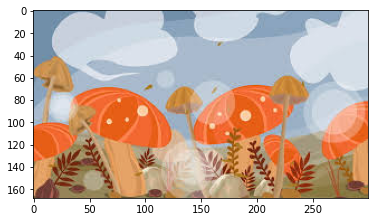

In [8]:
URL = 'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQ5npD51Jt1Y5-96ylTGefk6Ul8kRdBocVVMg&usqp=CAU'
img = Image.open(io.BytesIO(urlopen(URL).read()))
plt.imshow(img)

Посмотрим паттерны, на которые реагируют некоторые слои сети.

Deep Dream on 2 layer


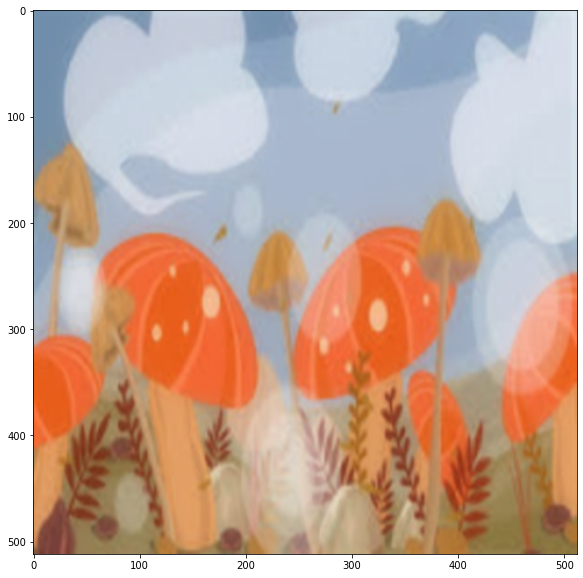

Deep Dream on 5 layer


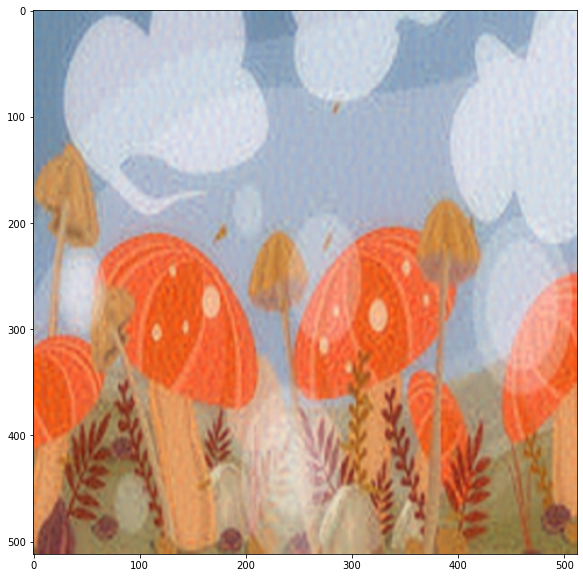

Deep Dream on 10 layer


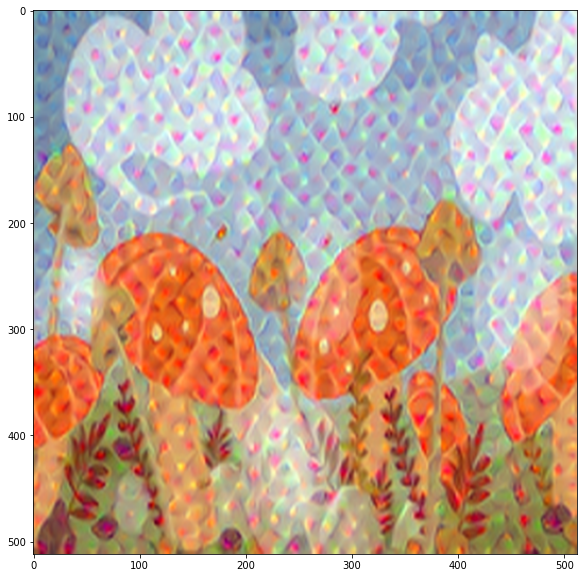

Deep Dream on 19 layer


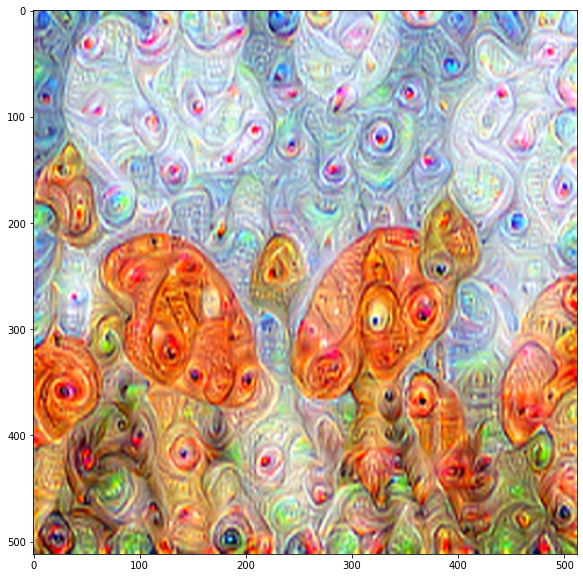

Deep Dream on 25 layer


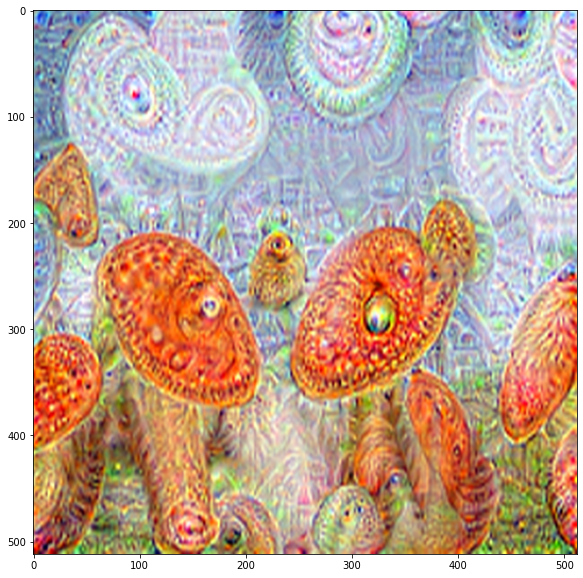

Deep Dream on 32 layer


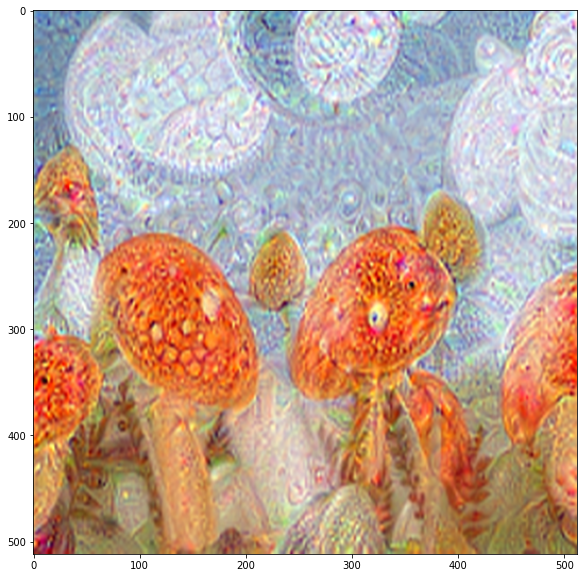

In [9]:
layers = [2, 5, 10, 19, 25, 32]
for i in layers:  
    print('Deep Dream on {} layer'.format(i))
    make_deepDream(img, vgg, i)

Посмотрим на преобразование белого изображения.

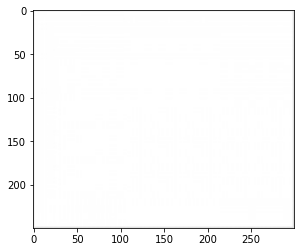

In [10]:
URL = 'https://www.meme-arsenal.com/memes/70b3bdcd191255d20b5a13ebf08edb91.jpg'
white_img = Image.open(io.BytesIO(urlopen(URL).read()))
plt.imshow(white_img)

Deep Dream on 2 layer


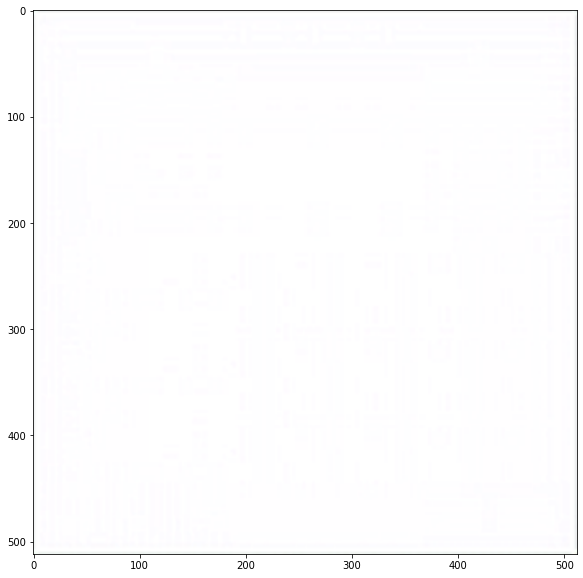

Deep Dream on 5 layer


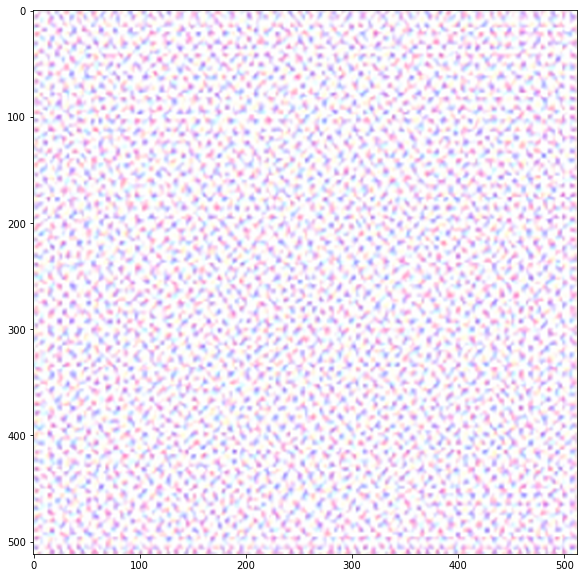

Deep Dream on 10 layer


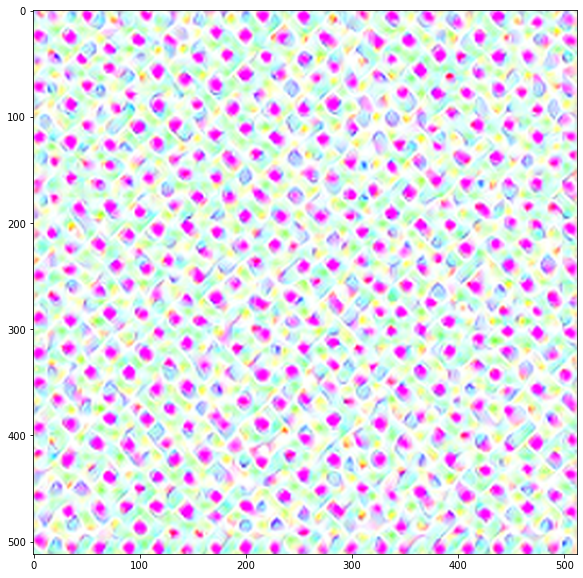

Deep Dream on 19 layer


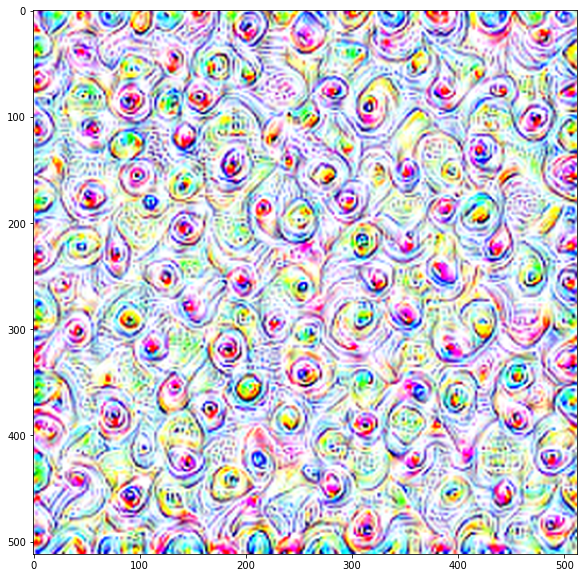

Deep Dream on 25 layer


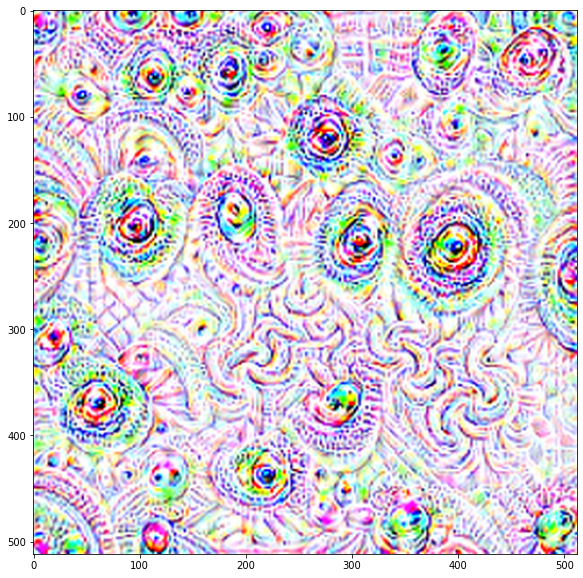

Deep Dream on 32 layer


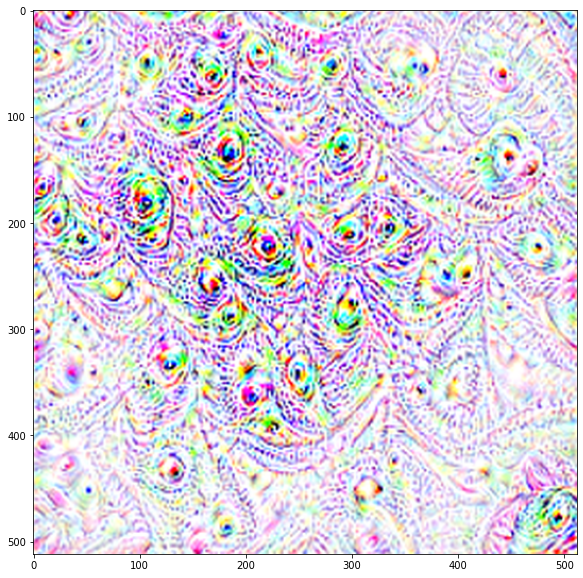

In [11]:
NUM_ITERATIONS = 10
for i in layers:  
    print('Deep Dream on {} layer'.format(i))
    make_deepDream(white_img, vgg, i)

Посмотрим на преобразования случейного изображения

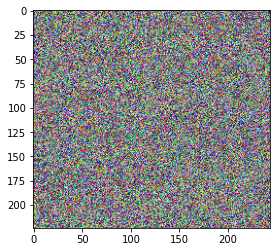

In [12]:
random_img = np.random.randn(224, 244, 3)
random_img = Image.fromarray(np.uint8(random_img * 255))
plt.imshow(random_img)

Deep Dream on 2 layer


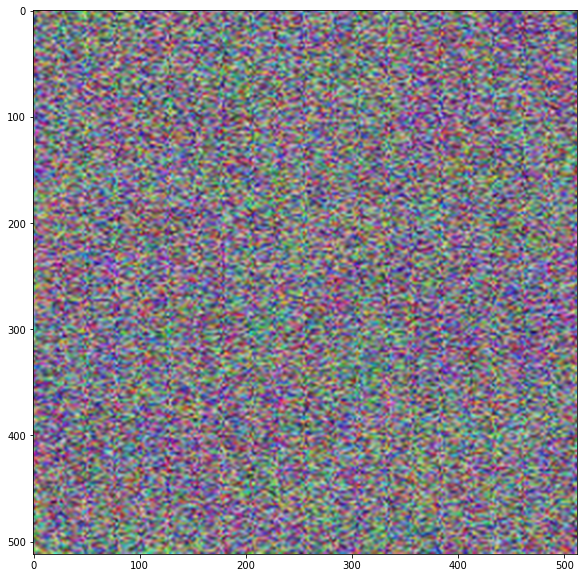

Deep Dream on 5 layer


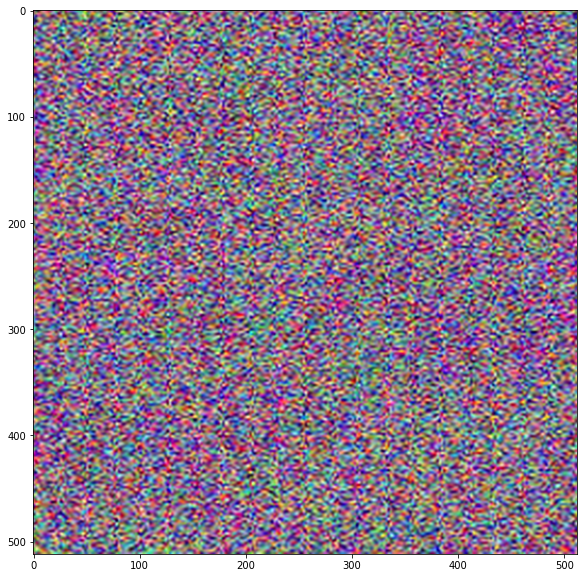

Deep Dream on 10 layer


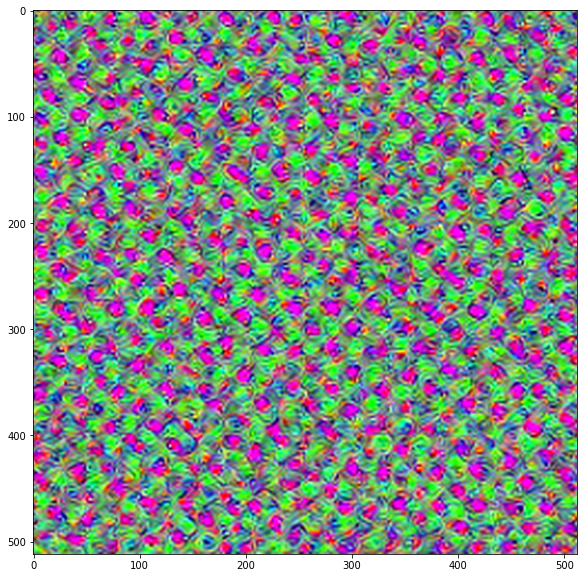

Deep Dream on 19 layer


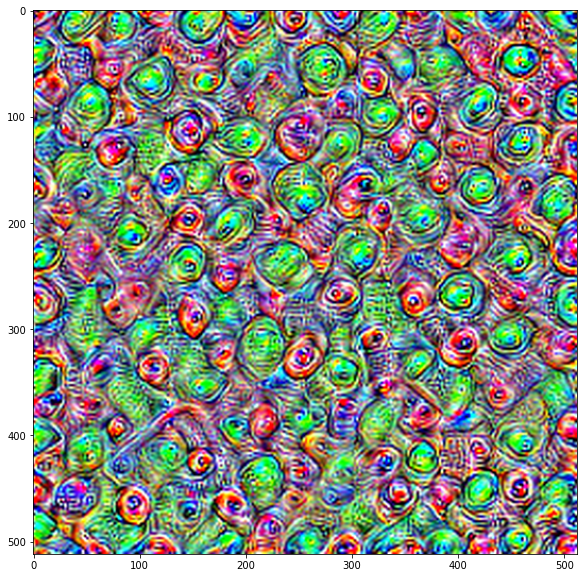

Deep Dream on 25 layer


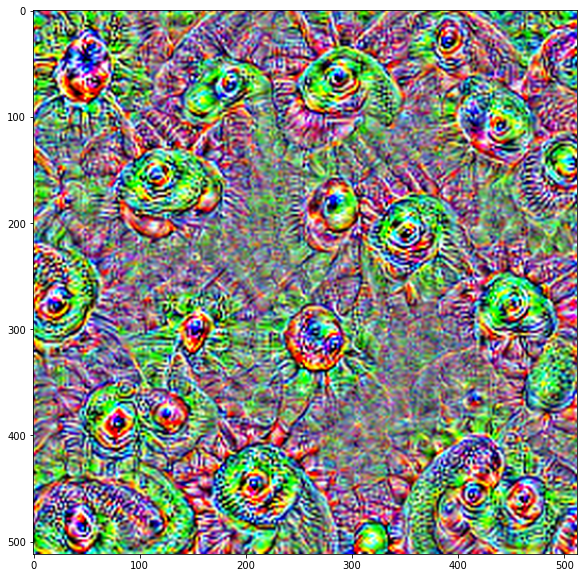

Deep Dream on 32 layer


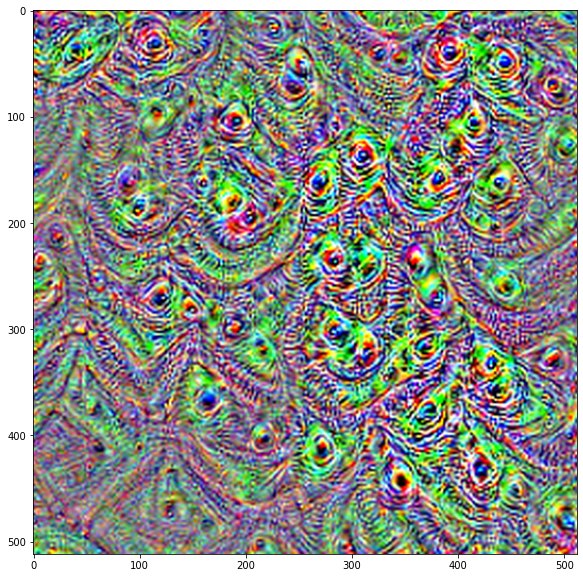

In [13]:
for i in layers:  
    print('Deep Dream on {} layer'.format(i))
    make_deepDream(random_img, vgg, i)

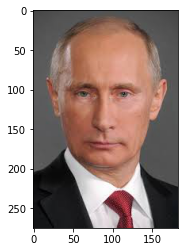

In [14]:
URL = 'data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxISEhUSEhIVFhUVGBYVFRUWFxUVFRcVFRUWFxUVFhUYHSggGBolHRUXITEhJSkrLi4uFx8zODMtNygtLisBCgoKDg0OGxAQGC0fHR8rLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0rLS0tLS0tLS0tLS0tLS0tLf/AABEIARMAtwMBIgACEQEDEQH/xAAcAAAABwEBAAAAAAAAAAAAAAAAAQIDBAUGBwj/xAA9EAABAwIDBAcHAgQGAwAAAAABAAIRAyEEMUEFElFhBiJxgZGh8AcTMkKxweFS0RQjgvEzQ2KSorIVFnL/xAAZAQEAAwEBAAAAAAAAAAAAAAAAAQIEAwX/xAAkEQEBAAICAgICAgMAAAAAAAAAAQIRAyESMQRBMlFhcRMiM//aAAwDAQACEQMRAD8AxwCMBKASoQJASoRgJYCBICNKhCEBQjhGAkPqAaoFQhCQKk5funAY7fWirc5F5x2iQhLHr0E/SZ2+u5VvIvOGosIQrA0vX4hNHDqJywvBUOEIUl2H5ph1rFXmUrncLCIREJwhJIVlTZCSWp0pKBshJITpCSQgZLUE4QggdhGAjCOEAhGEcI4QEEaBsoWJfNjYcNT2qLdJk2VVrF1mZcf2RNw5y8h9zp9U1h6smwJOQ/Yclb4fDE/EO4W7iuGebTx8e/SPTwun0sB3qTTwvHLgLKcxh/AsnGMXHzaJx6MYfCjgpbKMWSqTeSkBircl/E0KY9QkPocFLZh50T1PCkZp5HipKvVNxZV2OpN5355zrIz71rX4MGxCrMdse1hI4fhWxzVy49slhcUQ7ccewnPsKnoYvZIjgeKrKNR1Mw6SNVqxzlYuTisWJCSQltM3CBC6OJshEQlkIkDRCNKIQQLASggAjhAaACClYGiHOvkAT4IIz6fd6zUH+GLzy5q52p1eqB1tTwnSePYrDYmySWOqHRcMra04YxAwmBawZKYwIPzTtJvFZcq3YYlNpyn2UkdNqkU1yddG20lIp0PWSFJt1JpomEspwlJW6gQpNEhCE41iDmIhBxGCa6yym2tl7s5clt3NVXtrD7zCeC6YZarjyY7jHYJpiPX4Tym4KiCCIvy4gwR9D3BIx+FLHcnXHrvW3jy3087kx12hlJKcSSF0ciCESUQggcQCNHCAAK+2Zht2lvfM4+Qy7tVSU2yQAtayiGtjOwH477eKrkvgz7qG8/jJtx7YWuwjA3DObpBPfH9vFUAHWJ5x2+pV9TeBSPMEevWq5T7d2Zm6dZmo7nXunabljyehj6WFJqlNYo+FKsGNVNLEsYnGBKYxONap0bIDJS2004xqfDFaYmzAYihTC2AmtxW0rtEqNTFenvNI5KXWCbsoiL6ZLCUi2qRoTH4KmbbYDS5sM9xIGfaU9iqMOLuYv4x65I8S3fa4cWnxDcvp4LVxsHLGVKSUtyStDKSUaBQQOI0SMIJOAbL2jif7nwWqgG/GY5HL7LL7PHXCvffwyZ0gd9p8VTJ0wMV2RA5qdvHcAnPh4wq5lcE9W5y7IGqfFcz1uyOS4ytMitrjrFO0W3SK/wAScprLl7bcfSwoOgqypFVFM3VnQcoSfm5ToKaaLyl7wUh+kVJDlFpFSN5XhYUUhqMIFFUXEFNgTKXXN0hir9l9ItajIIOv9x5geKg0nQS03Nx3tz8Z81cVRYjwVRiZBBGdzPKJntyWrH0w5ztlajbkJuFK2gQajyLSZ8bqMVoZBIIIIHYQCCNBYYSgWlpMdZpIg5DnwP7qZWd1b6ZCfD6+Spmn3ZDxMEdYaWtKshfuEdsASs/nu1svFMZLPtP2fSEA6nXVPVWCcu712pOF6rQeUoOeBvOJEnL/AEjU9wRKurUzvElCmE0/GguJnsHLRMt2gBckAeazWbrVMtTtaQQArHC1NFmP/YqZORsp2G2o11wVFxsWmcrVMbZNgXUbDY2fJOU68lR0t2n02pwBVpxoaJJTT9usbE2njZXiLdLz3cpJaqqlt5hyv2R9lJo7Va8wRHP12qelPInENumwU/VMmVFGarYsVUqKtr1Ji2nkTf7qZWsobWb9ozt4n14rrhl0zcuO8mbxdNznOIaSBYkAkWtcqItpj6pp7lOkAd4w4nQa95lZDFMh7hwc4eBK78fJ5dOHPwf45Lv2ZKNEjXVmOI0lHKB9plscJ8x+E/ha7SQNYMcyT+VGoOv22Uv/AMaSWRnILfFZeT/XL+3o8V8+KT9Lp8hsRpePNZvH1H9YAGCtQ4yCRwVG+nIPEqM7o4ptSOqHIzJyAF+xRy1nz1Q0cCfrAU3EYAOcLmNYspVfYG+wABpsWxO7IOs8Ux0nPyk6m1T/AOKpESx88S10+IzCFNjm5ONuyFd4LYW4CahJdeOvJDnEuc4u4klKo4LeEEW4yB387/VMuv5Tx9zdmi9g4pz7HPIrR0cOYJ5LKbDbu1S0GQt7u/y1ws7aJemOxjKklocBxJvAVN/AOcf8Q+A9BbTGbLaDvzMgWkR2qprbLD2uBIM5CYjtCvj7Rl+O/aBhMCTAGJp72gcRPkVNBq0XAVB2OB3mnv0UbZnRw+8MyGuLZBLC3ca/fAhvxHeJicraALTu2QLhtmmOobsHccp5LpnhNdOXHnb7x0i4fFO1VjNpCfwmzmtyA8JHdJSsTTzVNLfaBix1UjZ1AuMTEiSc45p6teyjswjxU3jIAyjgc5Vd6h47pzaFEb9MD1cLG414dUe4ZFziOwkrXdIK/u2lwzLdxva83PgCsWVo4Mftl+Zn6x/QigggtDEWgESNSFtVy3EODWkGxkcxFvuqQKfQLi218xHYs/POttXxcu7jVuasSPV1X0he/FOVqmR4tChisuObTxRNo4YFys6FLd0BCrMNXup4fK5zJ3sOYtwcLADuVHi5EgG31V9uyFSbTcp8ka+kLANiot/Q/wAMSsPspsvW6w56kKPtbXSPXolwEaKNTwoDp8irSmU1UaJVv7R69E0+wdyeN/wmwwp+myLlX2roKdONVHxjoEKTVrDJVeLrSq2miad3gc5VnvNMWE2VRhYJMmNApZIiQSA2S52kDOFXfekyfbOdMMTNUMGTRJ7Tb6DzWeJUjaGI95Uc/wDUbdmQ8oUZbsZqaeTyZeWVo0EEFZzKRopQRJSl4PEhoLTkb+ShgoSoyx8ppbDLxu4n47EhxBbZuUDkoU3Sj8PYfr/ZE4yAsvJNPQ4ctzaRQeZsrbDVlTUHKe18ZLhY1zuLCviNFR7TqXAU4lVleC8zpZTirl1FpsJt1rqPwwsr0epdbNa9jBu2Uydo2ZD4KDnXRuZZRBIMJelp2lByJ1QptpSio2aMVKscSomI9d6mVGqHV0UIqXsxgIJIBuoXSvHhtL3bc32/pGf2HeqnHbVqUn7rCIi458VTYnEuqO3nGT6sFp4+O7lvpi5ufGY3GezZKJBEtLCMI0QQRBaCJBSkEEaJA7TdYjsPgm8kbSiYb+Sz8sbPjZdaPsT9N6jsTjRCzWN8qZvKt2jh3E7zCJ5qW26U1kqZ0ZWVC2RtMtJYbO4cew6rWbK2mXiLkqho7NFSZGV/7Kf0epgEtuIPHkpulJvScMRiveQ5gDTlB3j3u08FYhh7080BGOaWLym6adLUkhJa+yqk1VN1ELbyVLfqoONr7lNzuAPjook3VLdRlNo1d6o4848LKLKDiiXoSamnj5Xd2NBEjUoAIIkaBxEjIRIAiRoiEBhA2PaiCdq4Z3um1o6hcWA8x6I7lTkm8Xbgy1kdCTWfCbw75ajeJssb05dw0/aA5+B/ZO4ba1MZuCaNEG2SZa0fO0GNVaaqNdtTsnbWHkDeAlSKL6THk7w6x45LN0v4X5h9uPBTKBwrrZ5Zkn7qdR1mMag4pujlExO1GtN3Ad/0TFDDUT8LB3kx9VIq7KY5sOY2OEAeardftTwO4baAcM1LZxWepbO906Wkxw/ZXjH9VUtTrQ6jurKoOkmJ6rWDW57Bl5/RXGLqbrQsbjMSajy7w7NF14cd5b/TL8nPxx1+zBRI0FsecCCJGgCCCCB0oEJRSUBIIKm2rtYDqM7z9gga2rjTUe2ix0BxDSeJJjwXYMTsSmcIMMwQ1rA1nItFj459pXA3ViHhwzBBHaLhd96P7RFahTePmaD5IS6c2puNN5pvEOBII5pfvlsulvRr3497SH8wZj9Y/dc8dvAmZBBvOc81mz49Vv4+bcXdAb1lNo7P4qlwWKyV7QxgOa4ZSxrxylh+nsphzCnU9g0iLASmqNUEfdS8BjdCo2uXh8HuaeuSlwga4KbfVAulQTWYE0x4y01UbFYpIw9JzzfLh+6aVuUHj3S179A0x4ZrILXbcO7ReOIA8wFkVr4J0875V3lACNJQldmYoIIkEBoIIIH0mo4ASbAarO4vpG7JjQO25/CqsTtJ9T4nE/TwQWu19tSC2nlqdT2Kg95KQ5yRKByo5dH9le2fiwzjcden2fO3xv3lc0lStnYx9Goyqww5jg4dvA8iLd6D0lQcqPpN0WbXmrSAFTUaP/Y81K6O7VZiqDKzMnC41a4Wc09hV5SKWbTLZdxxmpgXNJEEEGCCLgjinaDHNznuv9V0/bmwGYgbw6tQZO48nce1YzE7OdTduVGwR5jiDqs+cuPv02cWUy9XVQaFaPmPe132TjcSBfe8nfsn/wCCd8pPfCQaThY27RHmuW8a0S5z7Kp7RPPwI+qkMrOeipbPJzB73WPYrHCYKNCFXr6WuV+zeHwmpF+Ks2U90QjYE4KZcQAM7KVTlfZBfgMTVjrGm/3fL3fWnvc0eC5bg8SKjd4d44Fd82lh9zBupjP3Th/wK8xYXFGkQ8XBA3hxH7rZjjrHTzeTLyy208IJvD12vaHNMg+oKdVlCUaCCAIIFBBzwpdNtkbmqS2lZBGISYUp1JJFJAwAlQnSyEndQb32T7XLK7sO49SqC5vAVGi8drQf9oXY6AXm7ZGJNGqyo34mODh3GY78l6M2biG1GNqNMte0OB5OEhBY06MosXscVW7rmhw8xzB0UjCOVpRKJjCYjo7UpGWjebwIv45FQqmHmxbfhr4FdPATWI2fSqDrsaeeR7iLrjlwy+mjD5Fnvtys4MD4fCE5Sdxlava/Rt7OtRl7dW/OOY/UOWfas0YBM2jPlxCzZY3G9teGUzm4XTYtF0ZwG+73hHVblzdr4Ko2Rs9+KcA2W0h8T8i4cG8ua39Kg1jAxogAQAOC7cWG7uuPPyanjEHaA3gRpBC80dKtk/w+IfS0F29h9Fem8U2y4r7X8BuvpVwLPBYTzb+FqYa5jhsW+k6WntGhV7g9uMd8QLT4hUOIpzdRVA3bKgcJaQRyRrF0MQQZBIPJWmG229tngOHHI/sg0CCg0Nq0nfNung63nkggyDhKDar28xzTm6gKc5fhSDbigc7Hy8U8XWSWYcC5v64JTkDcIiEtEQgOkbrtnst2n73Ce7J61F27/Q67fPeHcFxILbezHa3ucWxpPUq/y3dpuw/7oHeUHdcKFZUHKHRapLCoTE5pS5Udj1S9L+lNLAUfeP61R1qVKQN53Ek/Cwau+6JmNt1EzpH0ipYKnv1LuPwUxG84/YcSVzrH+0IVHXwVMgkSXO3nngOqzjYAE5FYnaXSCpiahq1XS53GzQMw1s2aAIsD83EpunU3s9Rryzv2cz8S45Z17PB8PimPfddI6N+01khmJpBjTk+lLgLxdurQbSMzkF0ehiWVWB9NwcxwlrmmQRyK811qcHv5C8RwsdB+kAwJKvuhPS2rg6wZ8VF5AqU+E/5jB8p1gDKNSFbHLbN8n4mM7x6dvxeSwntG2Z77A1IHWpkVG92f1W19+2owPYZa4SCNQoeKw4qNew5PaW+IhdHmvLrlGr0tQrTbGGNKtUYbbriPNQSFIgFOU6mh8U5UpSkMYgWQjQQRCPXJhScG8Fo5W700U1TduO5FEpzikBKckhECQKUiIRJEKVgqpaQQYIIII46FRil0jdB6d6L7UGJw1Ktq5o3uTxZ48QVbyuVexrbFquFceFWn5NeP+p8V1Bz4ExJ0HrREw+ahAkCXfKOfPkuLdONk4l1V+IquNQ5OOW4Lw0D5WZC3Oc5PYsM4kEnM+oHJVW0cN/MuLPEFRZt1487hdx56qBzTI7Z1tzte8xfMcFNwWKvzzHGNM4J00PFbrpR0MzqUB20+V53fHJc5rUCw2tyjWeEHUHT5QFyyxelw833i0RaC3++R8OGVpJuh0Zob+KAIkNa5x1vZufHnrpYBRdlYnebfhF+IzvNrATBB0C2XsswTamIxRcJ3WUhpYvLydLfALaZKvH7d/m2Xh8o0vR/H+4f7px/lPPVP6HH7FarIqi2lsWAS3rDUawn9jYskCm8yR8J/UBoeYWh4Ncc9qeA91jnkCz+sO+5+qxhXVvbThP8ACqjhB8/wuUSiCXJpOuTRRAyUEhBSgaS9oIhGjUJDDPtBzH0TqjVBBDhpn2KQDIlAaNEEaBCAOqNySiWl6G7W/hsVRrfK1w3+bHdV/kSV6RDg4WyOX2XlHDOXf/Z1tj3+DpyZdT/lu/o+E97d0omNRSMFKr0we64TTs068otFfXZeFz72i7IptYMQIa4uDHD9cyRbU2XQtoOiCuY+0nae/UpUAbNBe6+psBGpAM96rfTrwb85piMBVc2pLYuRcndzIi+cQDeYEHIrp3svqtZXqtLutVpsLWxALaZdOtiPeC3+qVy+l8fOfqfASO6Gnitt0Pfu4/D59YVGzugZ0y4ZG08NJbxXOfk9LKeXx8pXYQ5V+J2fJ3mGDnHPiOCl036HNDeuuzx2I9ptA1cE4kQ+n1nDkLlw5WXDpXoHpk0lsfqa5p7CPyvPpEEjgSEVBybI8UspBRBBCCEo0QII0EESOEnC/D3n7IIIHgjKCCBDkko0ESco5+uC6j7H6rt6u2bfyzHM74nyCNBB1YJb8kEEWiDix1Xd3ryXDeljz/GVTPzR3NsPAfU8UEFXJo+P+SrpO655bv8Ays4cwYWj2JVIxmEg/wCdTGmRdB8igguN/KPVw/45u019DrKDzdGgtDwlF0o+FvaV5+2kIrVf/t//AGKJBQrTJSCggpQbQQQUof/Z'
putin_img = Image.open(io.BytesIO(urlopen(URL).read()))
plt.imshow(putin_img)

Deep Dream on 2 layer


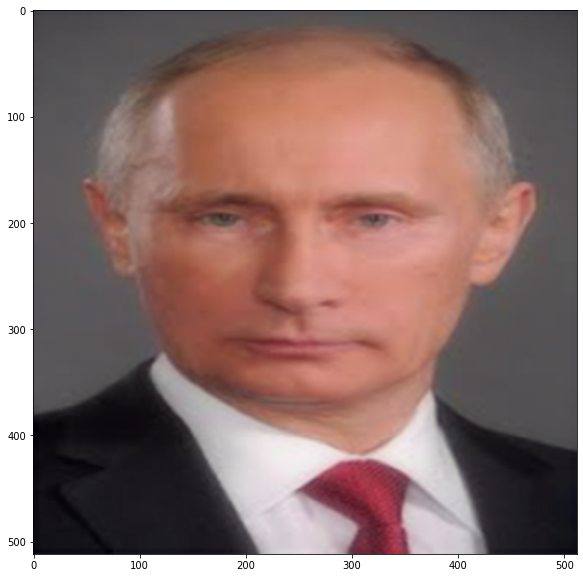

Deep Dream on 5 layer


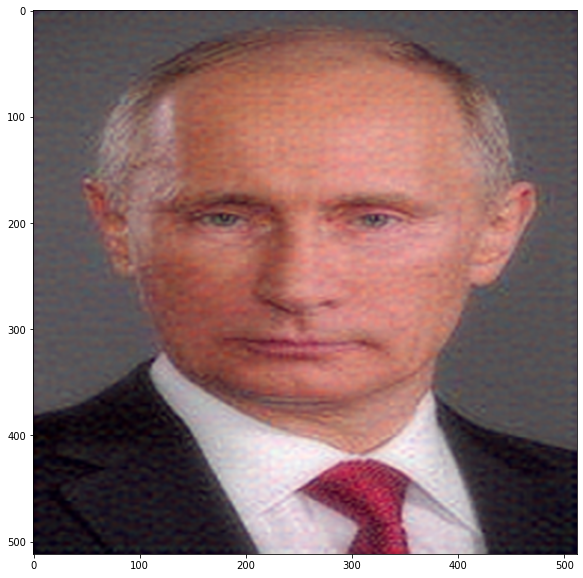

Deep Dream on 10 layer


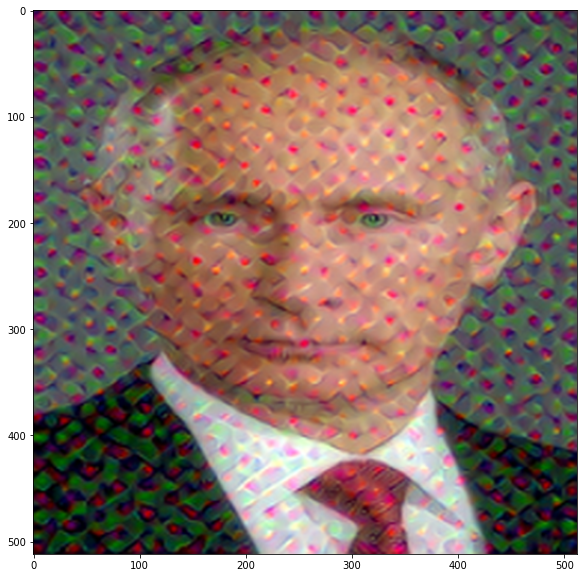

Deep Dream on 19 layer


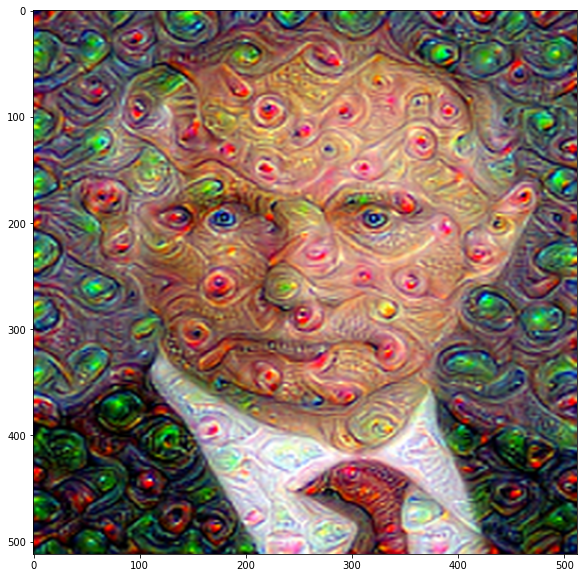

Deep Dream on 25 layer


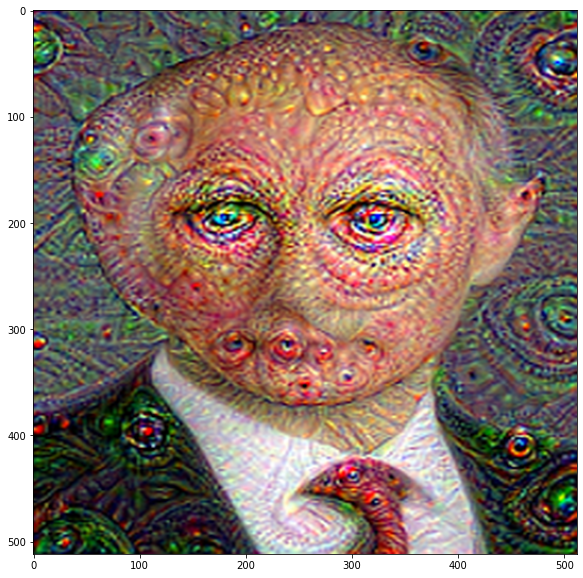

Deep Dream on 32 layer


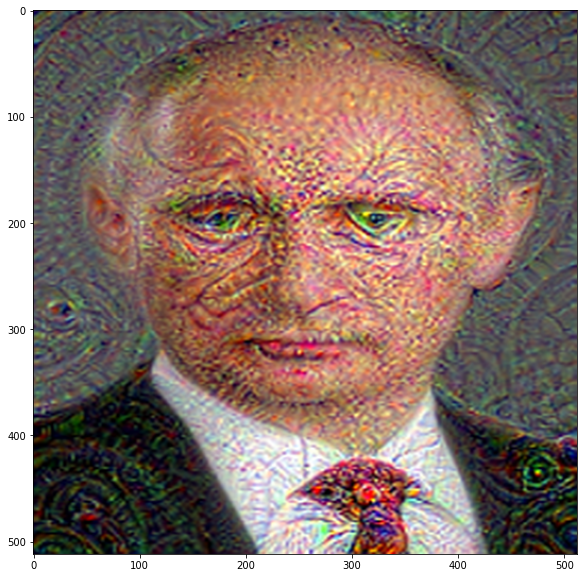

In [15]:
NUM_ITERATIONS=5
for i in layers:  
    print('Deep Dream on {} layer'.format(i))
    make_deepDream(putin_img, vgg, i)